# About Dataset

The dataset contains EEG signals from 11 subjects with labels of alert and drowsy. It can be opened with Matlab. We extracted the data for our own research purpose from another public dataset:

Cao, Z., et al., Multi-channel EEG recordings during a sustained-attention driving task. Scientific data, 2019. 6(1): p. 1-8.

If you find the dataset useful, please give credits to their works.

The details on how the data were extracted are described in our paper:

"Jian Cui, Zirui Lan, Yisi Liu, Ruilin Li, Fan Li, Olga Sourina, Wolfgang Müller-Wittig, A Compact and Interpretable Convolutional Neural Network for Cross-Subject Driver Drowsiness Detection from Single-Channel EEG, Methods, 2021, ISSN 1046-2023, https://doi.org/10.1016/j.ymeth.2021.04.017."

The codes of the paper above are accessible from:

https://github.com/cuijiancorbin/A-Compact-and-Interpretable-Convolutional-Neural-Network-for-Single-Channel-EEG

The data file contains 3 variables and they are EEGsample, substate and subindex.

"EEGsample" contains 2022 EEG samples of size 20x384 from 11 subjects. Each sample is a 3s EEG data with 128Hz from 30 EEG channels.
"subindex" is an array of 2022x1. It contains the subject indexes from 1-11 corresponding to each EEG sample.
"substate" is an array of 2022x1. It contains the labels of the samples. 0 corresponds to the alert state and 1 correspond to the drowsy state.

The unbalanced version of this dataset is accessible from:
https://figshare.com/articles/dataset/EEG_driver_drowsiness_dataset_unbalanced_/16586957

# Importing Libraires 

In [1]:
import scipy.io
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.io import loadmat
from tabulate import tabulate
import matplotlib.pyplot as plt

# Loading Dataset

In [2]:
file_path = 'EEG driver drowsiness dataset.mat'
mat_data = scipy.io.loadmat(file_path)

In [3]:
print(mat_data)

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Thu Dec 12 16:15:31 2019', '__version__': '1.0', '__globals__': [], 'EEGsample': array([[[ 4.08097622e+00,  5.36373657e+00,  2.16892286e+00, ...,
         -2.43467111e+00, -1.08033326e+01, -4.06570287e+00],
        [ 3.78602291e+00,  6.18806022e+00,  1.72710622e+00, ...,
         -2.23788269e+00, -1.08040545e+01, -3.16985550e+00],
        [ 8.34680437e+00,  8.69160090e+00, -1.09056499e-02, ...,
          2.30521997e+00, -1.33921422e+01, -5.27739673e+00],
        ...,
        [ 1.52884814e+00,  7.93795880e-01, -1.45126572e+00, ...,
         -1.22710349e+00, -5.26310889e+00, -1.22684549e+00],
        [-1.19949821e+00, -1.54496214e+00, -4.31985930e+00, ...,
         -5.32550694e+00, -5.48814272e+00, -1.57636907e+00],
        [ 1.59400945e+00,  1.90051435e+00, -4.64426331e+00, ...,
         -3.48251971e+00, -2.09547756e+00,  4.01980667e+00]],

       [[ 5.10435476e+00,  2.66309990e-01,  3.92736106e+00, ...,
         -2.43

# Exploratory Data Analysis

In [4]:
# Inspecting the keys and structure of the loaded data
mat_data.keys(), {key: type(mat_data[key]) for key in mat_data.keys()}

(dict_keys(['__header__', '__version__', '__globals__', 'EEGsample', 'subindex', 'substate']),
 {'__header__': bytes,
  '__version__': str,
  '__globals__': list,
  'EEGsample': numpy.ndarray,
  'subindex': numpy.ndarray,
  'substate': numpy.ndarray})

<div style="background-color: #cce5ff; padding: 10px; border: 1px solid #0066cc;">
    <h2 style="color: #0066cc; font-weight: bold;">Assigning Variables</h2>
    
</div>


In [5]:
eeg_samples = mat_data['EEGsample']
subindex = mat_data['subindex']
substates = mat_data['substate']

### Calculate the duration of each sample in seconds

EEGsample" contains 2022 EEG samples of size 20x384 from 11 subjects. Each sample is a 3s EEG data with 128Hz from 30 EEG channels. "subindex" is an array of 2022x1. It contains the subject indexes from 1-11 corresponding to each EEG sample. "substate" is an array of 2022x1. It contains the labels of the samples. 0 corresponds to the alert state and 1 correspond to the drowsy state.

In [6]:
# Calculate the duration of each sample in seconds
sampling_rate = 128  # Hz

num_samples, num_channels, num_time_points = eeg_samples.shape
sample_duration = num_time_points / sampling_rate

### Check for missing values

In [7]:
missing_values = np.isnan(eeg_samples).sum()
if missing_values == 0:
    print("No missing values in the EEG data.")
else:
    print("Number of missing values:", missing_values)

No missing values in the EEG data.


In [8]:
print("Number of subjects:", len(np.unique(subindex)))
print("EEGsample shape:", eeg_samples.shape)
print("Number of Samples:", num_samples)
print("Number of Channels:", num_channels)
print("Number of Time Points:", num_time_points)
print("Sample Duration (seconds):", sample_duration)

unique_labels, label_counts = np.unique(substates, return_counts=True)
print("Unique labels:", unique_labels)
print("Label counts:", label_counts)

Number of subjects: 11
EEGsample shape: (2022, 30, 384)
Number of Samples: 2022
Number of Channels: 30
Number of Time Points: 384
Sample Duration (seconds): 3.0
Unique labels: [0 1]
Label counts: [1011 1011]


#### The initial exploration of the EEG dataset reveals the following details:

#### EEG Samples (EEGsample):

  * The dataset contains 2022 EEG samples.
  * Each EEG sample is from 30 channels.
  * Each channel has 384 data points, corresponding to a 3-second EEG recording at a sampling rate of 128Hz.

#### Subject States (substate):

  * There are two unique states: 0 representing the alert state and 1 representing the drowsy state.
  * Each state has 1011 samples, indicating a balanced dataset with respect to the two states.

#### Subject Indexes (subindex):

  * There are 11 unique subjects in the dataset (labeled 1 to 11).
  * The distribution of samples across subjects varies, ranging from a minimum of 102 samples to a maximum of 314 samples per subject.

## State-specific Analysis: 'Alert' and 'Drowsy'

In [9]:
substates_flat = substates.flatten()

In [10]:
# Calculating means and standard deviations for each channel in both states

#Alert States
mean_alert = np.mean(eeg_samples[substates_flat == 0], axis=(0, 2))
std_alert = np.std(eeg_samples[substates_flat == 0], axis=(0, 2))

#Drowsy States
mean_drowsy = np.mean(eeg_samples[substates_flat == 1], axis=(0, 2))
std_drowsy = np.std(eeg_samples[substates_flat == 1], axis=(0, 2))

In [11]:
# Creating a DataFrame for easy viewing
stats_df = pd.DataFrame({
    'Channel': range(1, 31),
    'Mean_Alert': mean_alert,
    'Std_Alert': std_alert,
    'Mean_Drowsy': mean_drowsy,
    'Std_Drowsy': std_drowsy
})

In [12]:
stats_df  

,Channel,Mean_Alert,Std_Alert,Mean_Drowsy,Std_Drowsy
0,1,0.120450,17.630071,-0.163686,10.802148
1,2,0.082160,17.209800,-0.163763,12.170468
2,3,0.052289,9.635932,-0.061430,9.706984
3,4,0.002035,30.798487,-0.113082,11.617223
4,5,0.022715,9.642534,-0.159155,11.707889
5,6,0.021788,26.476227,-0.154311,17.197473
6,7,0.019232,12.678096,-0.126242,9.635353
7,8,0.046900,8.752803,-0.070030,9.094665
8,9,0.023307,9.758593,-0.130595,11.230886
9,10,0.017935,9.891951,-0.138523,12.140691


## EEG Channel Statistics Across Subjects and Timepoints

In [13]:
# Compute basic statistics for each EEG channel
mean_values = np.mean(eeg_samples, axis=(0, 2))  # Compute mean along subjects and timepoints
std_values = np.std(eeg_samples, axis=(0, 2))    # Compute standard deviation along subjects and timepoints
min_values = np.min(eeg_samples, axis=(0, 2))    # Compute minimum along subjects and timepoints
max_values = np.max(eeg_samples, axis=(0, 2))    # Compute maximum along subjects and timepoints

# Create a list of dictionaries for each channel's statistics
channel_stats = [
    {
        "Channel": channel_index + 1,
        "Mean": f"{mean_values[channel_index]:.4f}",
        "Std Dev": f"{std_values[channel_index]:.4f}",
        "Min": f"{min_values[channel_index]:.4f}",
        "Max": f"{max_values[channel_index]:.4f}"
    }
    for channel_index in range(num_channels)
]

In [14]:
# Printing the table
print("Basic Statistics for EEG Channels")
print(tabulate(channel_stats, headers="keys", tablefmt="grid"))

Basic Statistics for EEG Channels
+-----------+---------+-----------+-----------+----------+
|   Channel |    Mean |   Std Dev |       Min |      Max |
+===========+=========+===========+===========+==========+
|         1 | -0.0216 |   14.621  |  -573.236 |  871.908 |
+-----------+---------+-----------+-----------+----------+
|         2 | -0.0408 |   14.9052 | -1299.32  |  911.153 |
+-----------+---------+-----------+-----------+----------+
|         3 | -0.0046 |    9.6717 |  -208.161 |  243.286 |
+-----------+---------+-----------+-----------+----------+
|         4 | -0.0555 |   23.2757 | -1302.31  | 1795.54  |
+-----------+---------+-----------+-----------+----------+
|         5 | -0.0682 |   10.7254 |  -259.186 |  157.868 |
+-----------+---------+-----------+-----------+----------+
|         6 | -0.0663 |   22.3244 | -1914.6   | 1294.24  |
+-----------+---------+-----------+-----------+----------+
|         7 | -0.0535 |   11.2602 |  -496.507 |  754.21  |
+-----------+---------

<div style="background-color: #cce5ff; padding: 10px; border: 1px solid #0066cc;">
    <h2 style="color: #0066cc; font-weight: bold;">Data Manipulation</h2>
    
</div>


# Segregating the data into alert and drowsy states

In [15]:
import scipy.io

In [16]:
eeg_samples = mat_data['EEGsample']
subindex = mat_data['subindex']
substates = mat_data['substate']

In [17]:
# Segregate the data into alert and drowsy states
alert_data = mat_data['EEGsample'][mat_data['substate'][:, 0] == 0, :]
drowsy_data = mat_data['EEGsample'][mat_data['substate'][:, 0] == 1, :]

In [18]:
# Save the segregated data as new datasets
scipy.io.savemat('alert_data.mat', {'EEGsample': alert_data})
scipy.io.savemat('drowsy_data.mat', {'EEGsample': drowsy_data})

# Data Manipulation - Alert State

In [19]:
# Load the alert data
alert_data = scipy.io.loadmat('alert_data.mat')

# Transpose the EEGsample for each sample
transposed_alert_data = np.transpose(alert_data['EEGsample'], (0, 2, 1))

transposed_alert_data.shape

(1011, 384, 30)

In [20]:
# Concatenate all the samples together
Manipulated_Alert_Data = np.concatenate(transposed_alert_data, axis=0)

Manipulated_Alert_Data.shape

(388224, 30)

In [21]:
# Create a new dataframe with the concatenated EEG values
Manipulated_Alert_Data = pd.DataFrame(Manipulated_Alert_Data)

In [22]:
Manipulated_Alert_Data.columns = ['EEG {}'.format(i) for i in range(1, 31)]

Manipulated_Alert_Data['substate'] = 0

In [23]:
Manipulated_Alert_Data_shape = Manipulated_Alert_Data.shape
print(Manipulated_Alert_Data_shape)

(388224, 31)


In [24]:
Manipulated_Alert_Data

,EEG 1,EEG 2,EEG 3,EEG 4,EEG 5,EEG 6,EEG 7,EEG 8,EEG 9,EEG 10,...,EEG 22,EEG 23,EEG 24,EEG 25,EEG 26,EEG 27,EEG 28,EEG 29,EEG 30,substate
0,4.080976,3.786023,8.346804,6.719097,8.357521,8.916676,6.862104,9.614278,8.955653,11.076102,...,4.477457,1.590643,8.856600,6.898189,3.846108,1.618809,1.528848,-1.199498,1.594009,0
1,5.363737,6.188060,8.691601,6.594982,7.950093,8.835506,7.987136,8.394441,7.126653,8.356511,...,2.415757,1.918520,7.423708,3.755487,1.427838,-0.657721,0.793796,-1.544962,1.900514,0
2,2.168923,1.727106,-0.010906,10.583628,2.440252,1.746089,1.159202,-1.002561,7.059705,1.720240,...,-4.692833,4.261903,3.151329,-1.637562,-5.816451,-8.913891,-1.451266,-4.319859,-4.644263,0
3,6.682761,4.633752,2.093427,16.253235,6.105603,3.943814,4.016592,2.393903,17.343024,6.441727,...,0.839859,2.543160,7.499411,4.182199,-0.059025,-0.736035,4.434387,3.438641,1.207515,0
4,9.795314,8.723788,10.936554,8.182007,8.306618,7.103265,7.980278,12.270826,9.309045,6.750704,...,2.970653,-0.216052,5.413562,5.600711,2.837383,4.172009,0.202442,1.743480,3.413565,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388219,8.233965,0.275736,6.446871,5.908036,9.747110,11.439683,-1.685268,5.394103,5.898229,12.230832,...,-6.909897,-8.072416,-0.579174,5.365872,-2.507618,-7.071795,-5.722929,2.618950,-3.075700,0
388220,7.406664,9.878674,-3.062066,9.699165,12.825886,16.227294,11.658202,0.792909,8.312962,14.986136,...,-4.750323,-9.749710,0.661105,7.605404,0.084582,-4.264237,-3.538781,3.539202,-0.909379,0
388221,13.849187,15.022659,-0.428879,12.096121,18.726862,20.367732,21.341497,-0.920176,11.466241,19.145924,...,2.819010,-14.607244,1.367658,10.402462,6.190984,3.495143,-5.398682,3.006524,-0.195928,0
388222,16.960690,11.183629,8.472685,8.712444,17.208050,19.493375,19.953374,2.115628,10.656352,18.752221,...,9.265103,-15.256238,-1.057022,8.016603,8.461495,8.418237,-9.056400,0.705703,-0.641096,0


In [25]:
Manipulated_Alert_Data.describe()

,EEG 1,EEG 2,EEG 3,EEG 4,EEG 5,EEG 6,EEG 7,EEG 8,EEG 9,EEG 10,...,EEG 22,EEG 23,EEG 24,EEG 25,EEG 26,EEG 27,EEG 28,EEG 29,EEG 30,substate
count,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,...,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.0
mean,0.120450,0.082160,0.052289,0.002035,0.022715,0.021788,0.019232,0.046900,0.023307,0.017935,...,0.021766,0.007225,-0.003592,0.019598,0.010883,0.033979,0.010209,-0.011278,0.016158,0.0
std,17.630093,17.209822,9.635944,30.798527,9.642547,26.476261,12.678112,8.752815,9.758606,9.891964,...,8.139659,7.684464,8.780677,9.051305,8.877557,7.612380,8.213531,8.012668,8.402200,0.0
min,-573.236473,-1299.322323,-179.743368,-1302.310821,-259.186417,-1914.601674,-496.506648,-257.126168,-264.446044,-170.110365,...,-412.436568,-164.084974,-182.130863,-160.504457,-188.102204,-300.202835,-155.316775,-164.679904,-170.630668,0.0
25%,-4.776408,-5.200087,-4.309381,-5.210375,-5.136774,-5.298737,-4.533854,-3.814357,-5.077397,-5.446187,...,-3.618430,-3.631967,-4.483550,-4.728144,-4.541708,-3.618739,-3.935085,-3.812024,-3.973197,0.0
50%,-0.075639,-0.078809,0.021210,-0.007062,-0.025080,-0.004596,0.032909,0.000847,0.002038,-0.015818,...,0.072676,0.064908,0.021311,0.014776,0.011861,0.067332,0.070167,0.027562,0.061650,0.0
75%,4.674139,5.061314,4.318260,5.122598,5.058932,5.269095,4.578348,3.898470,5.029046,5.397253,...,3.720945,3.728646,4.505347,4.764787,4.597949,3.740409,4.070610,3.884409,4.121255,0.0
max,871.907755,911.153120,243.285973,1795.543933,157.868435,1116.638265,754.210204,178.262784,358.262495,172.711611,...,169.197791,221.973860,228.132948,167.531582,191.191891,159.280290,153.842957,148.846683,146.055474,0.0


### Manipulated Alert Data Visualizations

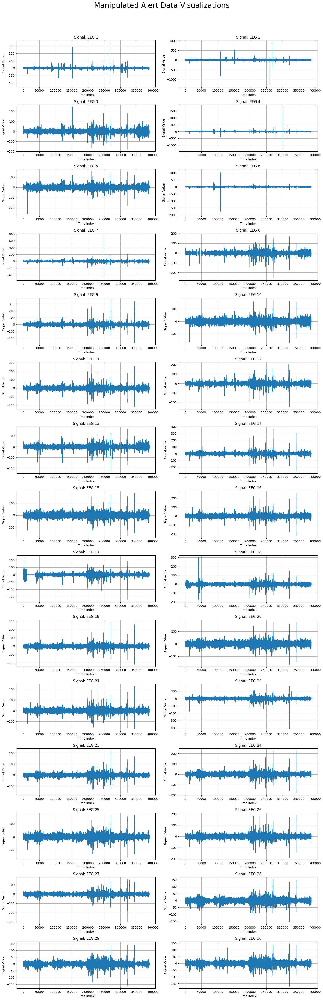

In [26]:
columns_of_interest = Manipulated_Alert_Data.columns[:-1]

# Set up subplots based on the number of selected columns
num_columns = 2
num_rows = (len(columns_of_interest) + num_columns - 1) // num_columns
fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(15, 3 * num_rows))
axes = axes.flatten()

# Plot each signal in a separate subplot
for i, signal_column in enumerate(columns_of_interest):
    Manipulated_Alert_Data[signal_column].plot(ax=axes[i], grid=True)
    axes[i].set_title(f"Signal: {signal_column}")
    axes[i].set_xlabel('Time Index')
    axes[i].set_ylabel('Signal Value')

# Add a title
title = plt.suptitle("Manipulated Alert Data Visualizations", fontsize=24, y=1.02)


plt.tight_layout()
plt.show()

# Data Manipulation - Drowsy State

In [27]:
# Load the alert data
drowsy_data = scipy.io.loadmat('drowsy_data.mat')

# Transpose the EEGsample for each sample
transposed_drowsy_data = np.transpose(drowsy_data['EEGsample'], (0, 2, 1))

transposed_drowsy_data.shape

(1011, 384, 30)

In [28]:
# Concatenate all the samples together
Manipulated_drowsy_data = np.concatenate(transposed_drowsy_data, axis=0)

Manipulated_drowsy_data.shape

(388224, 30)

In [29]:
# Create a new dataframe with the concatenated EEG values
Manipulated_drowsy_data = pd.DataFrame(Manipulated_drowsy_data)

In [30]:
Manipulated_drowsy_data.columns = ['EEG {}'.format(i) for i in range(1, 31)]

Manipulated_drowsy_data['substate'] = 1

Manipulated_drowsy_data

,EEG 1,EEG 2,EEG 3,EEG 4,EEG 5,EEG 6,EEG 7,EEG 8,EEG 9,EEG 10,...,EEG 22,EEG 23,EEG 24,EEG 25,EEG 26,EEG 27,EEG 28,EEG 29,EEG 30,substate
0,-9.340455,-2.581835,0.605112,-1.951353,-1.691814,0.000079,3.330641,-0.191926,-4.416670,-1.147983,...,2.129284,-3.047745,-4.376038,-3.188374,-0.385878,1.875040,-5.343100,-3.923701,-2.074438,1
1,-9.297278,1.208397,1.506896,-2.264259,-0.276102,2.584222,6.163738,1.151379,-4.483509,0.162938,...,5.101435,-6.010214,-4.166642,-2.759660,1.960440,2.900005,-5.235632,-4.409118,-0.922046,1
2,-5.377346,4.373476,1.989039,0.960820,4.204186,7.833417,6.751105,1.460457,-1.914790,4.162968,...,4.944842,-5.937366,-2.171945,1.778525,4.798910,3.802374,-4.404817,-2.675341,1.579044,1
3,-0.387827,6.691171,5.519700,7.556678,9.908533,9.829516,7.316607,5.024432,4.905958,11.028363,...,7.509409,-2.738498,3.898276,9.131125,11.175130,7.386306,-0.541670,2.996915,6.289799,1
4,4.371176,8.625327,7.997311,13.974010,13.865399,12.207135,6.853086,7.709539,11.165707,16.520067,...,9.410449,0.360403,9.101561,13.200414,15.277298,6.949633,-0.142043,4.255927,8.020452,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388219,6.868306,2.037630,10.935329,3.053171,2.061508,-2.051896,-6.980084,6.915801,1.292861,-2.156677,...,0.466622,1.703162,0.489967,-0.037224,-1.715912,1.355944,0.816035,0.522263,-0.399985,1
388220,3.248673,-3.479991,8.520732,-0.933774,-2.160580,-5.932663,-12.832424,4.543766,-2.418177,-6.189452,...,-1.080016,2.258167,-0.767202,-2.633476,-5.121715,-0.736463,0.412399,-0.159130,-2.200928,1
388221,5.805058,2.770440,8.983543,1.738981,-0.541900,-8.541175,-8.517280,3.491680,-1.389771,-5.822860,...,-3.365152,3.624552,0.280940,-3.084484,-4.691478,-3.197477,0.923831,1.341110,-1.338262,1
388222,7.142978,0.775242,9.888220,4.223264,0.790337,-6.479811,-12.121178,4.921120,0.083320,-4.330250,...,-2.798542,4.248466,1.042023,-2.643634,-3.409195,-2.482608,1.644079,1.565844,-0.301095,1


### Manipulated Drowsy Data Visualizations

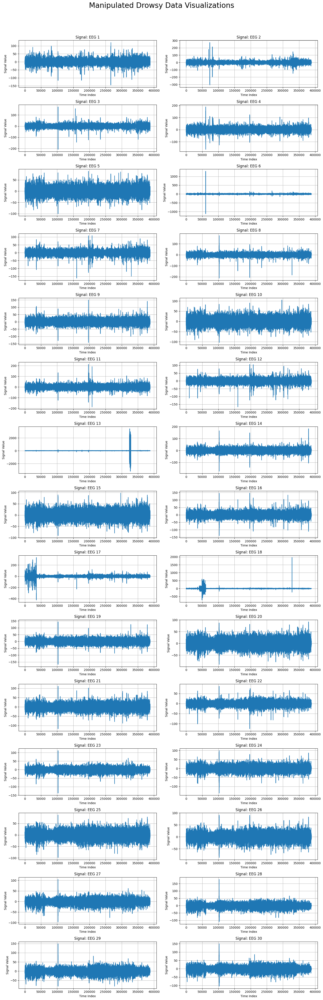

In [31]:
columns_of_interest = Manipulated_drowsy_data.columns[:-1]

# Set up subplots based on the number of selected columns
num_columns = 2
num_rows = (len(columns_of_interest) + num_columns - 1) // num_columns
fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(15, 3 * num_rows))
axes = axes.flatten()

# Plot each signal in a separate subplot
for i, signal_column in enumerate(columns_of_interest):
    Manipulated_drowsy_data[signal_column].plot(ax=axes[i], grid=True)
    axes[i].set_title(f"Signal: {signal_column}")
    axes[i].set_xlabel('Time Index')
    axes[i].set_ylabel('Signal Value')

# Add a title
title = plt.suptitle("Manipulated Drowsy Data Visualizations", fontsize=24, y=1.02)


plt.tight_layout()
plt.show()

# Creating new Manipulated EEG Data

In [32]:
# Concatenate them row-wise
Manipulated_EEG_Data = pd.concat([Manipulated_Alert_Data, Manipulated_drowsy_data], ignore_index=True)

Manipulated_EEG_Data = pd.DataFrame(Manipulated_EEG_Data)

Manipulated_EEG_Data

,EEG 1,EEG 2,EEG 3,EEG 4,EEG 5,EEG 6,EEG 7,EEG 8,EEG 9,EEG 10,...,EEG 22,EEG 23,EEG 24,EEG 25,EEG 26,EEG 27,EEG 28,EEG 29,EEG 30,substate
0,4.080976,3.786023,8.346804,6.719097,8.357521,8.916676,6.862104,9.614278,8.955653,11.076102,...,4.477457,1.590643,8.856600,6.898189,3.846108,1.618809,1.528848,-1.199498,1.594009,0
1,5.363737,6.188060,8.691601,6.594982,7.950093,8.835506,7.987136,8.394441,7.126653,8.356511,...,2.415757,1.918520,7.423708,3.755487,1.427838,-0.657721,0.793796,-1.544962,1.900514,0
2,2.168923,1.727106,-0.010906,10.583628,2.440252,1.746089,1.159202,-1.002561,7.059705,1.720240,...,-4.692833,4.261903,3.151329,-1.637562,-5.816451,-8.913891,-1.451266,-4.319859,-4.644263,0
3,6.682761,4.633752,2.093427,16.253235,6.105603,3.943814,4.016592,2.393903,17.343024,6.441727,...,0.839859,2.543160,7.499411,4.182199,-0.059025,-0.736035,4.434387,3.438641,1.207515,0
4,9.795314,8.723788,10.936554,8.182007,8.306618,7.103265,7.980278,12.270826,9.309045,6.750704,...,2.970653,-0.216052,5.413562,5.600711,2.837383,4.172009,0.202442,1.743480,3.413565,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
776443,6.868306,2.037630,10.935329,3.053171,2.061508,-2.051896,-6.980084,6.915801,1.292861,-2.156677,...,0.466622,1.703162,0.489967,-0.037224,-1.715912,1.355944,0.816035,0.522263,-0.399985,1
776444,3.248673,-3.479991,8.520732,-0.933774,-2.160580,-5.932663,-12.832424,4.543766,-2.418177,-6.189452,...,-1.080016,2.258167,-0.767202,-2.633476,-5.121715,-0.736463,0.412399,-0.159130,-2.200928,1
776445,5.805058,2.770440,8.983543,1.738981,-0.541900,-8.541175,-8.517280,3.491680,-1.389771,-5.822860,...,-3.365152,3.624552,0.280940,-3.084484,-4.691478,-3.197477,0.923831,1.341110,-1.338262,1
776446,7.142978,0.775242,9.888220,4.223264,0.790337,-6.479811,-12.121178,4.921120,0.083320,-4.330250,...,-2.798542,4.248466,1.042023,-2.643634,-3.409195,-2.482608,1.644079,1.565844,-0.301095,1


In [33]:
Manipulated_EEG_Data.describe()

,EEG 1,EEG 2,EEG 3,EEG 4,EEG 5,EEG 6,EEG 7,EEG 8,EEG 9,EEG 10,...,EEG 22,EEG 23,EEG 24,EEG 25,EEG 26,EEG 27,EEG 28,EEG 29,EEG 30,substate
count,776448.000000,776448.000000,776448.000000,776448.000000,776448.000000,776448.000000,776448.000000,776448.000000,776448.000000,776448.000000,...,776448.000000,776448.000000,776448.000000,776448.000000,776448.000000,776448.000000,776448.000000,776448.000000,776448.000000,776448.0
mean,-0.021618,-0.040802,-0.004570,-0.055523,-0.068220,-0.066261,-0.053505,-0.011565,-0.053644,-0.060294,...,-0.017509,-0.026515,-0.049814,-0.049215,-0.048120,-0.014090,-0.008072,-0.014516,-0.006941,0.5
std,14.620990,14.905172,9.671696,23.275682,10.725436,22.324431,11.260219,8.925568,10.520814,11.073835,...,7.917922,7.899842,9.362213,9.966547,9.443160,7.901001,9.166132,8.790766,9.168400,0.5
min,-573.236473,-1299.322323,-208.160484,-1302.310821,-259.186417,-1914.601674,-496.506648,-257.126168,-264.446044,-170.110365,...,-412.436568,-164.084974,-182.130863,-160.504457,-188.102204,-300.202835,-155.316775,-164.679904,-170.630668,0.0
25%,-5.350544,-5.673096,-4.867582,-5.980532,-6.031645,-6.040908,-5.034842,-4.501781,-5.895260,-6.349755,...,-3.989990,-4.059459,-5.113621,-5.467732,-5.173702,-4.049075,-4.513315,-4.367126,-4.517431,0.0
50%,-0.156583,-0.151739,-0.057676,-0.110664,-0.136852,-0.094769,-0.051081,-0.000729,-0.110086,-0.133952,...,0.042863,0.049731,-0.028798,-0.051791,-0.036366,0.070813,0.095885,0.052832,0.077466,0.5
75%,5.073020,5.396961,4.732961,5.728880,5.750800,5.840688,4.904647,4.418808,5.661637,6.091726,...,4.026763,4.130372,5.037588,5.361387,5.104271,4.161815,4.700240,4.482325,4.689910,1.0
max,871.907755,911.153120,243.285973,1795.543933,157.868435,1294.240965,754.210204,178.262784,358.262495,172.711611,...,169.197791,221.973860,228.132948,167.531582,191.191891,159.280290,179.167203,149.156242,149.996483,1.0


In [34]:
Manipulated_EEG_Data.shape

(776448, 31)

In [35]:
Manipulated_EEG_Data["substate"].value_counts()

0    388224
1    388224
Name: substate, dtype: int64

<div style="background-color: #cce5ff; padding: 10px; border: 1px solid #0066cc;">
    <h2 style="color: #0066cc; font-weight: bold;">Data Filtration</h2>
    
</div>


# Data Filtration - Savitzky-Golay filter

https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.savgol_filter.html

In [36]:
Manipulated_Alert_Data = Manipulated_Alert_Data
Manipulated_drowsy_data = Manipulated_drowsy_data

In [37]:
from scipy.signal import savgol_filter

# Define the parameters for the Savitzky-Golay filter
window_length = 2093  
polyorder = 1

In [38]:
# Function to apply Savitzky-Golay filter to a dataset
def apply_savgol_filter(dataset):
    filtered_data = pd.DataFrame()
    for col_name in dataset.columns[:-1]:
        filtered_column = savgol_filter(
            dataset[col_name], window_length, polyorder
        )
        filtered_data[f'Filtered_EEG_{col_name[-2:]}'] = filtered_column
    filtered_data['substate'] = dataset['substate']
    return filtered_data

In [39]:
# Apply Savitzky-Golay filter to both datasets
filtered_alert_data = apply_savgol_filter(Manipulated_Alert_Data)
filtered_drowsy_data = apply_savgol_filter(Manipulated_drowsy_data)

In [40]:
Manipulated_Alert_Data

,EEG 1,EEG 2,EEG 3,EEG 4,EEG 5,EEG 6,EEG 7,EEG 8,EEG 9,EEG 10,...,EEG 22,EEG 23,EEG 24,EEG 25,EEG 26,EEG 27,EEG 28,EEG 29,EEG 30,substate
0,4.080976,3.786023,8.346804,6.719097,8.357521,8.916676,6.862104,9.614278,8.955653,11.076102,...,4.477457,1.590643,8.856600,6.898189,3.846108,1.618809,1.528848,-1.199498,1.594009,0
1,5.363737,6.188060,8.691601,6.594982,7.950093,8.835506,7.987136,8.394441,7.126653,8.356511,...,2.415757,1.918520,7.423708,3.755487,1.427838,-0.657721,0.793796,-1.544962,1.900514,0
2,2.168923,1.727106,-0.010906,10.583628,2.440252,1.746089,1.159202,-1.002561,7.059705,1.720240,...,-4.692833,4.261903,3.151329,-1.637562,-5.816451,-8.913891,-1.451266,-4.319859,-4.644263,0
3,6.682761,4.633752,2.093427,16.253235,6.105603,3.943814,4.016592,2.393903,17.343024,6.441727,...,0.839859,2.543160,7.499411,4.182199,-0.059025,-0.736035,4.434387,3.438641,1.207515,0
4,9.795314,8.723788,10.936554,8.182007,8.306618,7.103265,7.980278,12.270826,9.309045,6.750704,...,2.970653,-0.216052,5.413562,5.600711,2.837383,4.172009,0.202442,1.743480,3.413565,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388219,8.233965,0.275736,6.446871,5.908036,9.747110,11.439683,-1.685268,5.394103,5.898229,12.230832,...,-6.909897,-8.072416,-0.579174,5.365872,-2.507618,-7.071795,-5.722929,2.618950,-3.075700,0
388220,7.406664,9.878674,-3.062066,9.699165,12.825886,16.227294,11.658202,0.792909,8.312962,14.986136,...,-4.750323,-9.749710,0.661105,7.605404,0.084582,-4.264237,-3.538781,3.539202,-0.909379,0
388221,13.849187,15.022659,-0.428879,12.096121,18.726862,20.367732,21.341497,-0.920176,11.466241,19.145924,...,2.819010,-14.607244,1.367658,10.402462,6.190984,3.495143,-5.398682,3.006524,-0.195928,0
388222,16.960690,11.183629,8.472685,8.712444,17.208050,19.493375,19.953374,2.115628,10.656352,18.752221,...,9.265103,-15.256238,-1.057022,8.016603,8.461495,8.418237,-9.056400,0.705703,-0.641096,0


In [41]:
filtered_alert_data = pd.DataFrame(filtered_alert_data)
filtered_drowsy_data = pd.DataFrame(filtered_drowsy_data)

In [42]:
filtered_alert_data

,Filtered_EEG_ 1,Filtered_EEG_ 2,Filtered_EEG_ 3,Filtered_EEG_ 4,Filtered_EEG_ 5,Filtered_EEG_ 6,Filtered_EEG_ 7,Filtered_EEG_ 8,Filtered_EEG_ 9,Filtered_EEG_10,...,Filtered_EEG_22,Filtered_EEG_23,Filtered_EEG_24,Filtered_EEG_25,Filtered_EEG_26,Filtered_EEG_27,Filtered_EEG_28,Filtered_EEG_29,Filtered_EEG_30,substate
0,-0.076244,0.092117,-0.186659,-0.151330,0.044207,-0.030518,0.054043,-0.197587,-0.308299,-0.012755,...,0.294352,0.100860,0.125127,0.205859,0.268348,0.082250,0.156876,0.191265,0.329550,0
1,-0.076334,0.091884,-0.186631,-0.151363,0.043964,-0.030706,0.053900,-0.197569,-0.308216,-0.012926,...,0.294109,0.100771,0.124984,0.205593,0.268042,0.082287,0.156851,0.191211,0.329357,0
2,-0.076425,0.091650,-0.186602,-0.151397,0.043722,-0.030894,0.053756,-0.197550,-0.308132,-0.013096,...,0.293866,0.100681,0.124841,0.205326,0.267735,0.082324,0.156826,0.191157,0.329164,0
3,-0.076516,0.091417,-0.186574,-0.151430,0.043479,-0.031081,0.053612,-0.197532,-0.308049,-0.013267,...,0.293623,0.100592,0.124697,0.205059,0.267429,0.082361,0.156800,0.191102,0.328971,0
4,-0.076607,0.091183,-0.186546,-0.151464,0.043237,-0.031269,0.053468,-0.197514,-0.307965,-0.013437,...,0.293381,0.100503,0.124554,0.204792,0.267122,0.082398,0.156775,0.191048,0.328778,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388219,-0.596932,-0.185433,-0.880317,-0.173760,-0.158072,0.154201,-0.554594,-0.048307,-0.123709,-0.096838,...,0.175149,0.835020,0.230962,0.402994,0.360476,0.180763,0.620100,0.596975,0.352858,0
388220,-0.597301,-0.185677,-0.880795,-0.173835,-0.158169,0.153987,-0.556022,-0.048005,-0.123750,-0.096953,...,0.175074,0.836008,0.231278,0.403443,0.360558,0.180714,0.620645,0.597637,0.353332,0
388221,-0.597670,-0.185922,-0.881274,-0.173910,-0.158267,0.153773,-0.557450,-0.047703,-0.123791,-0.097068,...,0.174998,0.836997,0.231594,0.403892,0.360640,0.180665,0.621190,0.598299,0.353807,0
388222,-0.598038,-0.186166,-0.881752,-0.173985,-0.158365,0.153559,-0.558877,-0.047401,-0.123831,-0.097182,...,0.174923,0.837985,0.231910,0.404341,0.360722,0.180616,0.621735,0.598961,0.354281,0


In [43]:
filtered_alert_data.describe()

,Filtered_EEG_ 1,Filtered_EEG_ 2,Filtered_EEG_ 3,Filtered_EEG_ 4,Filtered_EEG_ 5,Filtered_EEG_ 6,Filtered_EEG_ 7,Filtered_EEG_ 8,Filtered_EEG_ 9,Filtered_EEG_10,...,Filtered_EEG_22,Filtered_EEG_23,Filtered_EEG_24,Filtered_EEG_25,Filtered_EEG_26,Filtered_EEG_27,Filtered_EEG_28,Filtered_EEG_29,Filtered_EEG_30,substate
count,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,...,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.0
mean,0.120319,0.082155,0.052051,0.002016,0.022783,0.021775,0.018628,0.047034,0.023249,0.017962,...,0.021845,0.007732,-0.003376,0.019934,0.011066,0.033938,0.010477,-0.010941,0.016471,0.0
std,1.259788,1.271156,0.605215,0.693812,0.596219,0.608161,0.712734,0.569134,0.590785,0.588617,...,0.557863,0.555538,0.571837,0.585340,0.568459,0.534897,0.560774,0.543249,0.556920,0.0
min,-13.933066,-11.414259,-3.727651,-5.361215,-3.969228,-8.191365,-9.829839,-3.558572,-4.138619,-4.081315,...,-4.421178,-3.970616,-3.956672,-3.819239,-3.703901,-3.667635,-3.625681,-3.926753,-4.063919,0.0
25%,-0.157864,-0.172630,-0.139764,-0.168448,-0.173711,-0.168274,-0.168576,-0.135896,-0.164618,-0.173127,...,-0.115276,-0.133589,-0.182506,-0.158333,-0.170545,-0.115920,-0.155219,-0.139397,-0.152696,0.0
50%,0.022810,0.027772,0.013452,0.015807,-0.000056,0.011735,0.017715,-0.000001,0.009691,0.002299,...,0.014755,-0.005488,-0.017815,-0.008877,-0.002526,0.020274,-0.001917,-0.002646,0.005114,0.0
75%,0.232536,0.246803,0.192598,0.198573,0.192686,0.204183,0.202211,0.168574,0.173985,0.188191,...,0.141094,0.110729,0.138093,0.143626,0.151976,0.141201,0.137827,0.122231,0.160574,0.0
max,27.532067,24.505686,5.263537,5.723228,5.356223,7.841194,8.171692,5.666138,5.676597,5.193424,...,5.551942,5.334978,5.237885,5.477572,5.228172,5.331308,5.644854,5.250024,5.282543,0.0


In [44]:
filtered_drowsy_data

,Filtered_EEG_ 1,Filtered_EEG_ 2,Filtered_EEG_ 3,Filtered_EEG_ 4,Filtered_EEG_ 5,Filtered_EEG_ 6,Filtered_EEG_ 7,Filtered_EEG_ 8,Filtered_EEG_ 9,Filtered_EEG_10,...,Filtered_EEG_22,Filtered_EEG_23,Filtered_EEG_24,Filtered_EEG_25,Filtered_EEG_26,Filtered_EEG_27,Filtered_EEG_28,Filtered_EEG_29,Filtered_EEG_30,substate
0,-0.746216,-0.380263,-0.945701,-1.559972,-0.496004,-0.034298,0.702326,-0.909102,-0.748669,-0.414343,...,0.018234,-0.023981,-0.148267,-0.256726,-0.335903,0.096814,0.026031,-0.125182,0.001356,1
1,-0.745471,-0.379674,-0.944903,-1.558763,-0.495431,-0.034268,0.702051,-0.908347,-0.748019,-0.413913,...,0.018095,-0.024191,-0.148338,-0.256723,-0.335742,0.096652,0.025757,-0.125223,0.001196,1
2,-0.744725,-0.379084,-0.944104,-1.557554,-0.494858,-0.034238,0.701777,-0.907591,-0.747369,-0.413483,...,0.017956,-0.024401,-0.148409,-0.256720,-0.335582,0.096491,0.025483,-0.125265,0.001036,1
3,-0.743979,-0.378495,-0.943305,-1.556345,-0.494284,-0.034208,0.701502,-0.906836,-0.746718,-0.413052,...,0.017818,-0.024611,-0.148480,-0.256717,-0.335421,0.096330,0.025209,-0.125306,0.000875,1
4,-0.743233,-0.377905,-0.942506,-1.555136,-0.493711,-0.034178,0.701228,-0.906080,-0.746068,-0.412622,...,0.017679,-0.024821,-0.148551,-0.256714,-0.335261,0.096169,0.024935,-0.125348,0.000715,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388219,0.616284,-0.176767,1.255021,0.632565,0.223231,-0.535056,-1.796342,0.950094,0.442257,0.085793,...,-0.409422,0.256281,0.338713,-0.175129,0.105762,-0.382333,0.126896,0.078523,-0.168009,1
388220,0.616863,-0.176831,1.255732,0.633084,0.223534,-0.535020,-1.796886,0.950657,0.442635,0.086104,...,-0.409544,0.256480,0.339009,-0.175281,0.106015,-0.382428,0.126974,0.078591,-0.168054,1
388221,0.617441,-0.176896,1.256443,0.633603,0.223837,-0.534984,-1.797429,0.951219,0.443013,0.086416,...,-0.409665,0.256679,0.339305,-0.175433,0.106267,-0.382522,0.127052,0.078659,-0.168098,1
388222,0.618019,-0.176961,1.257154,0.634122,0.224140,-0.534949,-1.797973,0.951782,0.443392,0.086727,...,-0.409787,0.256877,0.339601,-0.175584,0.106520,-0.382617,0.127130,0.078728,-0.168142,1


In [45]:
filtered_drowsy_data.describe()

,Filtered_EEG_ 1,Filtered_EEG_ 2,Filtered_EEG_ 3,Filtered_EEG_ 4,Filtered_EEG_ 5,Filtered_EEG_ 6,Filtered_EEG_ 7,Filtered_EEG_ 8,Filtered_EEG_ 9,Filtered_EEG_10,...,Filtered_EEG_22,Filtered_EEG_23,Filtered_EEG_24,Filtered_EEG_25,Filtered_EEG_26,Filtered_EEG_27,Filtered_EEG_28,Filtered_EEG_29,Filtered_EEG_30,substate
count,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,...,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.000000,388224.0
mean,-0.163765,-0.164071,-0.061471,-0.113406,-0.159282,-0.154308,-0.126369,-0.070120,-0.130722,-0.138579,...,-0.056777,-0.060063,-0.095863,-0.118101,-0.107080,-0.062128,-0.026187,-0.017703,-0.029985,1.0
std,0.549651,0.569943,0.594570,0.474055,0.465655,0.816516,0.525758,0.550385,0.447278,0.461782,...,0.426212,0.405615,0.406888,0.409506,0.392637,0.404104,0.420898,0.450410,0.399269,0.0
min,-3.140342,-3.537631,-3.968141,-2.790251,-3.015858,-20.737085,-2.237764,-3.939373,-3.230575,-3.152306,...,-2.952234,-3.148489,-3.238651,-3.202465,-2.952461,-3.247489,-3.422447,-2.457615,-2.920200,1.0
25%,-0.363886,-0.382055,-0.288863,-0.325249,-0.345293,-0.361830,-0.376513,-0.266399,-0.320784,-0.340707,...,-0.198377,-0.176768,-0.235494,-0.266215,-0.252906,-0.209918,-0.172736,-0.162993,-0.189262,1.0
50%,-0.115702,-0.115241,-0.055456,-0.089170,-0.105549,-0.105439,-0.108229,-0.054672,-0.091442,-0.101884,...,-0.051123,-0.020496,-0.067252,-0.089015,-0.074602,-0.028978,0.001566,-0.004521,-0.007795,1.0
75%,0.099779,0.125543,0.163944,0.119237,0.090990,0.115245,0.127153,0.141738,0.104632,0.104562,...,0.089493,0.113451,0.097065,0.079252,0.082243,0.119180,0.161031,0.134840,0.156741,1.0
max,3.518925,2.670830,5.094667,2.888590,2.810950,13.580806,3.060707,4.364330,2.685467,2.836208,...,3.603884,2.208890,2.663396,2.832249,2.913712,2.135149,4.704731,6.098213,4.675182,1.0


In [46]:
# Concatenate both datasets row-wise
filtered_data = pd.concat([filtered_alert_data, filtered_drowsy_data], ignore_index=True)

### Filtered Alert Data Visualization

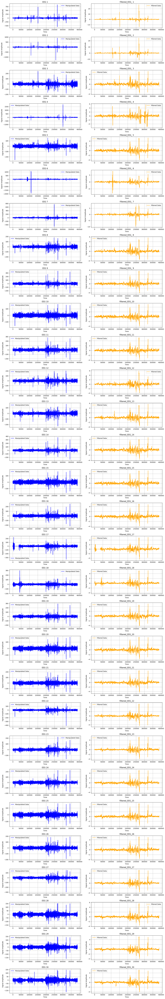

In [47]:
# Extract column names
Manipulated_Alert_Data_columns = Manipulated_Alert_Data.columns[:-1]
filtered_alert_data_columns = filtered_alert_data.columns[:-1]

# Set the number of rows and columns
num_rows = len(Manipulated_Alert_Data_columns)
num_cols = 2 
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3*num_rows))

# Plotting for each column in separate figures
for i, (col_manipulated, col_filtered) in enumerate(zip(Manipulated_Alert_Data_columns, filtered_alert_data_columns)):

    # Plot Manipulated Data
    axes[i, 0].plot(Manipulated_Alert_Data[col_manipulated], color='blue', label='Manipulated Data')
    axes[i, 0].set_title(f'{col_manipulated}')
    axes[i, 0].set_xlabel('Time')
    axes[i, 0].set_ylabel('Signal Amplitude')
    axes[i, 0].legend()
    axes[i, 0].grid(True)  

    # Plot Filtered Data
    axes[i, 1].plot(filtered_alert_data[col_filtered], color='orange', label='Filtered Data')
    axes[i, 1].set_title(f'{col_filtered}')
    axes[i, 1].set_xlabel('Time')
    axes[i, 1].set_ylabel('Signal Amplitude')
    axes[i, 1].legend()
    axes[i, 1].grid(True)  

plt.tight_layout()
plt.show()


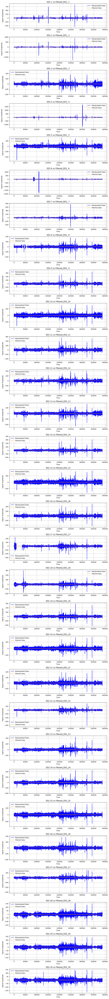

In [48]:
# Extract column names 
Manipulated_Alert_Data_columns = Manipulated_Alert_Data.columns[:-1]
filtered_alert_data_columns = filtered_alert_data.columns[:-1]

# Set the number of rows and columns 
num_rows = len(Manipulated_Alert_Data_columns)
num_cols = 1
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 3*num_rows))

# Plotting for each column in the same figure
for i, (col_manipulated, col_filtered) in enumerate(zip(Manipulated_Alert_Data_columns, filtered_alert_data_columns)):
    
    axes[i].plot(Manipulated_Alert_Data[col_manipulated], color='blue', label='Manipulated Data')
    axes[i].plot(filtered_alert_data[col_filtered], color='orange', label='Filtered Data')
    
    axes[i].set_title(f'{col_manipulated} vs {col_filtered}')
    axes[i].set_xlabel('Time')
    axes[i].set_ylabel('Signal Amplitude')
    
    axes[i].grid(True)
    axes[i].legend()

plt.tight_layout()
plt.show()


### Filtered Drowsy Data Visualization

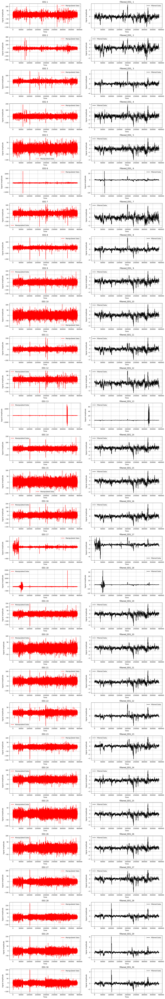

In [49]:
Manipulated_drowsy_data_columns = Manipulated_drowsy_data.columns[:-1]
filtered_drowsy_data_columns = filtered_drowsy_data.columns[:-1]

# Set the number of rows and columns 
num_rows = len(Manipulated_drowsy_data_columns)
num_cols = 2  
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3*num_rows))

# Plotting for each column in separate figures
for i, (col_manipulated, col_filtered) in enumerate(zip(Manipulated_drowsy_data_columns, filtered_drowsy_data_columns)):

    # Plot Manipulated Data
    axes[i, 0].plot(Manipulated_drowsy_data[col_manipulated], color='red', label='Manipulated Data')
    axes[i, 0].set_title(f'{col_manipulated}')
    axes[i, 0].set_xlabel('Time')
    axes[i, 0].set_ylabel('Signal Amplitude')
    axes[i, 0].legend()
    axes[i, 0].grid(True) 

    # Plot Filtered Data
    axes[i, 1].plot(filtered_drowsy_data[col_filtered], color='black', label='Filtered Data')
    axes[i, 1].set_title(f'{col_filtered}')
    axes[i, 1].set_xlabel('Time')
    axes[i, 1].set_ylabel('Signal Amplitude')
    axes[i, 1].legend()
    axes[i, 1].grid(True)

plt.tight_layout()
plt.show()

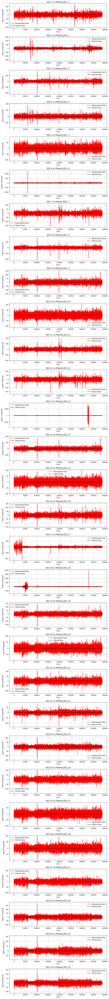

In [50]:
# Extract column names
Manipulated_drowsy_data_columns = Manipulated_drowsy_data.columns[:-1]
filtered_drowsy_data_columns = filtered_drowsy_data.columns[:-1]

# Set the number of rows and columns
num_rows = len(Manipulated_drowsy_data_columns)
num_cols = 1
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 3*num_rows))

# Plotting for each column in the same figure
for i, (col_manipulated, col_filtered) in enumerate(zip(Manipulated_drowsy_data_columns, filtered_drowsy_data_columns)):
    
    axes[i].plot(Manipulated_drowsy_data[col_manipulated], color='red', label='Manipulated Data')
    axes[i].plot(filtered_drowsy_data[col_filtered], color='black', label='Filtered Data')  
    
    axes[i].set_title(f'{col_manipulated} vs {col_filtered}')
    axes[i].set_xlabel('Time')
    axes[i].set_ylabel('Signal Amplitude')
    
    axes[i].grid(True)
    axes[i].legend()

plt.tight_layout()
plt.show()


# Shuffle Dataset

In [51]:
from sklearn.utils import shuffle

# Shuffle the combined dataset
shuffled_data = shuffle(filtered_data, random_state=42)

# Display the resulting shuffled DataFrame
print(shuffled_data.head())

        Filtered_EEG_ 1  Filtered_EEG_ 2  Filtered_EEG_ 3  Filtered_EEG_ 4  \
31373         -0.145838        -0.258781         0.231225         0.140412   
503322        -0.124801        -0.071798         0.070699        -0.056876   
192821         0.376828         0.033511         0.254332         0.407510   
604921         0.310937        -0.058902        -0.092863        -0.217122   
110346         0.549996         0.116918         0.086578         0.379927   

        Filtered_EEG_ 5  Filtered_EEG_ 6  Filtered_EEG_ 7  Filtered_EEG_ 8  \
31373          0.044780        -0.076939        -0.071635         0.245007   
503322        -0.190701        -0.176768        -0.111820         0.079012   
192821         0.450375         0.255486         0.122856         0.515486   
604921        -0.142069        -0.363272         0.059477        -0.105768   
110346        -0.387424        -2.329554        -0.545583         0.093047   

        Filtered_EEG_ 9  Filtered_EEG_10  ...  Filtered_EEG_22

In [52]:
data = shuffled_data

X = data.iloc[:, :-1] 
y = data.iloc[:, -1]  

In [53]:
X

,Filtered_EEG_ 1,Filtered_EEG_ 2,Filtered_EEG_ 3,Filtered_EEG_ 4,Filtered_EEG_ 5,Filtered_EEG_ 6,Filtered_EEG_ 7,Filtered_EEG_ 8,Filtered_EEG_ 9,Filtered_EEG_10,...,Filtered_EEG_21,Filtered_EEG_22,Filtered_EEG_23,Filtered_EEG_24,Filtered_EEG_25,Filtered_EEG_26,Filtered_EEG_27,Filtered_EEG_28,Filtered_EEG_29,Filtered_EEG_30
31373,-0.145838,-0.258781,0.231225,0.140412,0.044780,-0.076939,-0.071635,0.245007,0.132558,0.085322,...,-0.036022,0.024895,0.148699,0.150030,0.059098,0.022232,0.086024,0.263457,0.197356,0.126369
503322,-0.124801,-0.071798,0.070699,-0.056876,-0.190701,-0.176768,-0.111820,0.079012,-0.071240,-0.166685,...,-0.236486,-0.146240,0.118868,-0.061757,-0.120563,-0.178311,0.013510,0.152337,0.128307,0.008095
192821,0.376828,0.033511,0.254332,0.407510,0.450375,0.255486,0.122856,0.515486,0.452360,0.396100,...,0.253413,0.296877,0.372260,0.363074,0.252114,0.114044,0.273901,0.296365,0.273698,0.124663
604921,0.310937,-0.058902,-0.092863,-0.217122,-0.142069,-0.363272,0.059477,-0.105768,-0.102926,-0.247922,...,-0.251833,-0.096744,0.151847,-0.110447,-0.274643,-0.247439,-0.017951,0.039949,0.091559,-0.285175
110346,0.549996,0.116918,0.086578,0.379927,-0.387424,-2.329554,-0.545583,0.093047,-0.231535,-0.209498,...,-0.193637,-0.252203,-0.158051,-0.123071,-0.168939,-0.009352,-0.430965,-0.220520,-0.119387,-0.346538
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259178,0.204072,-4.642175,0.811187,0.865613,0.813487,0.634390,-0.104800,0.819792,0.760223,0.819671,...,0.832050,0.756962,0.773140,0.766157,0.745917,0.840122,0.674380,0.849062,0.447253,0.804757
365838,0.201704,0.242243,0.142474,0.204591,0.329091,0.191551,0.228908,0.339762,0.187687,0.331945,...,0.256607,0.097230,0.166464,0.197198,0.161125,0.102229,0.089774,0.240483,0.038130,-0.070692
131932,-0.046096,-0.069448,-0.107661,0.060585,-0.091444,-0.192885,-0.040381,-0.147190,-0.011743,-0.072975,...,-0.041431,0.015166,0.075251,-0.249859,0.046110,-0.097759,0.145237,0.201040,0.147994,0.230599
671155,-0.239693,-0.693877,-0.263445,-0.545849,-0.649036,-0.678052,-0.387205,-0.206271,-0.439428,-0.549648,...,-0.852450,-0.348651,-0.253242,-0.339880,-0.370271,-0.548570,-0.254630,-0.390479,-0.351961,-0.379300


In [54]:
y

31373     0
503322    1
192821    0
604921    1
110346    0
         ..
259178    0
365838    0
131932    0
671155    1
121958    0
Name: substate, Length: 776448, dtype: int64

# Shapley Approximation (shap)

https://github.com/shap/shap

In [55]:
#Training and Testing Split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [56]:
import shap
import xgboost as xgb

In [57]:
params = {
    "objective": "binary:logistic",
    "eval_metric": "logloss",
    "tree_method": "gpu_hist",
}

In [58]:
model = xgb.XGBClassifier(**params)
model.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=0, gpu_id=0,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [59]:
# Explain predictions using SHAP
explainer = shap.Explainer(model)
shap_values = explainer.shap_values(X_test)

# Visualizations - Shapley Approximation (shap)

In [60]:
# Calculate feature importance
ft_importance = pd.DataFrame({"Feature Importance": np.abs(shap_values).mean(0)}, index=X_train.columns)
X_cols = ft_importance.query('`Feature Importance` > 0').sort_values(by="Feature Importance", ascending=False)

# Display
X_cols.style.background_gradient(cmap='viridis', vmin=.001, vmax=.6).format({"Feature Importance": "{:.3f}"})


,Feature Importance
Filtered_EEG_21,0.505
Filtered_EEG_ 1,0.494
Filtered_EEG_20,0.412
Filtered_EEG_17,0.380
Filtered_EEG_25,0.325
Filtered_EEG_ 2,0.300
Filtered_EEG_18,0.291
Filtered_EEG_14,0.284
Filtered_EEG_27,0.273
Filtered_EEG_23,0.270


### SHAP Summary Plot

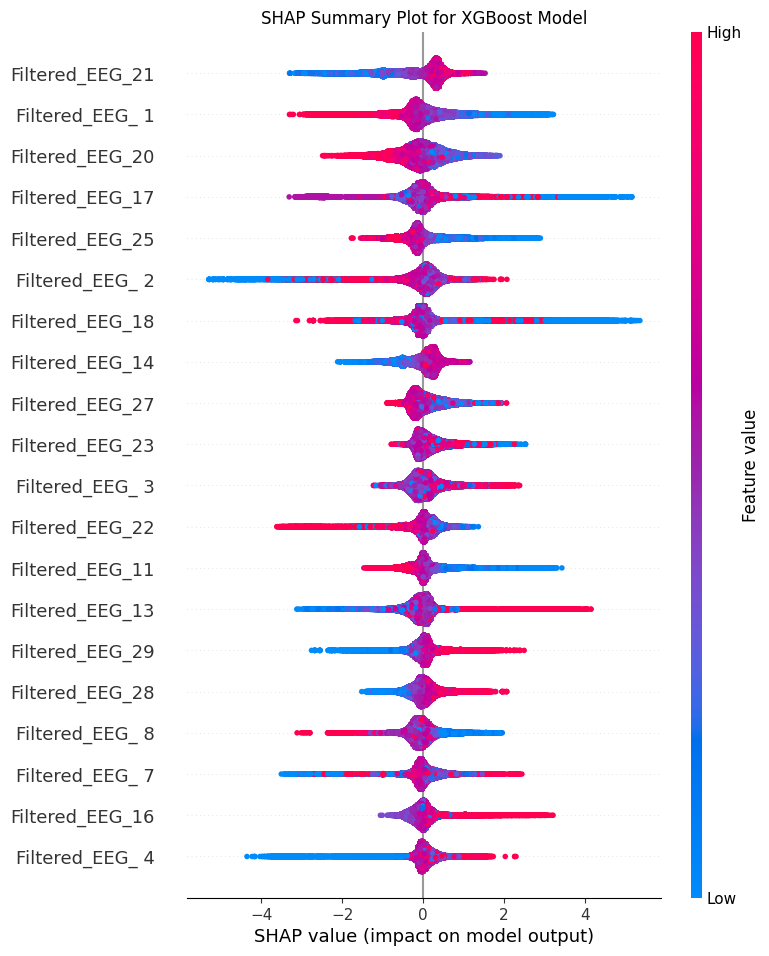

In [61]:
# Plot SHAP summary plot
shap.summary_plot(shap_values, X_test, show=False)
plt.title("SHAP Summary Plot for XGBoost Model")
plt.show()

### SHAP Bar plot

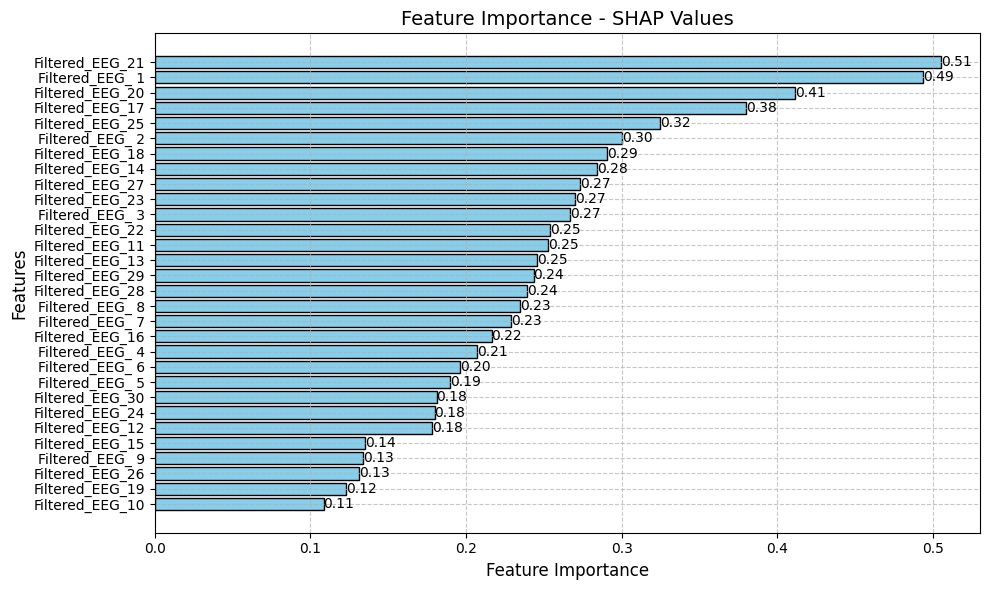

In [62]:
fig, ax = plt.subplots(figsize=(10, 6))


bars = ax.barh(X_cols.index, X_cols['Feature Importance'], color='skyblue', edgecolor='black')
ax.grid(axis='both', linestyle='--', alpha=0.7)
ax.set_xlabel('Feature Importance', fontsize=12)
ax.set_ylabel('Features', fontsize=12)
ax.set_title('Feature Importance - SHAP Values', fontsize=14)
ax.invert_yaxis()


for bar in bars:
    ax.text(bar.get_width(), bar.get_y() + bar.get_height()/2, 
            '{:.2f}'.format(bar.get_width()), 
            va='center', ha='left', fontsize=10)


plt.tight_layout()
plt.show()

### SHAP Scatter plot

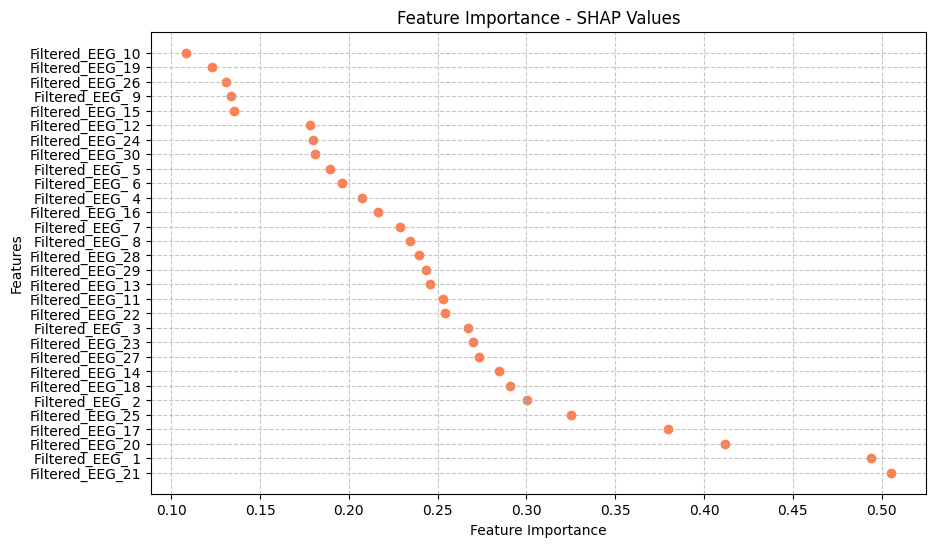

In [63]:
# Scatter plot of feature importance
plt.figure(figsize=(10, 6))
plt.scatter(X_cols['Feature Importance'], X_cols.index, color='coral')
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importance - SHAP Values')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

### SHAP Pie Chart

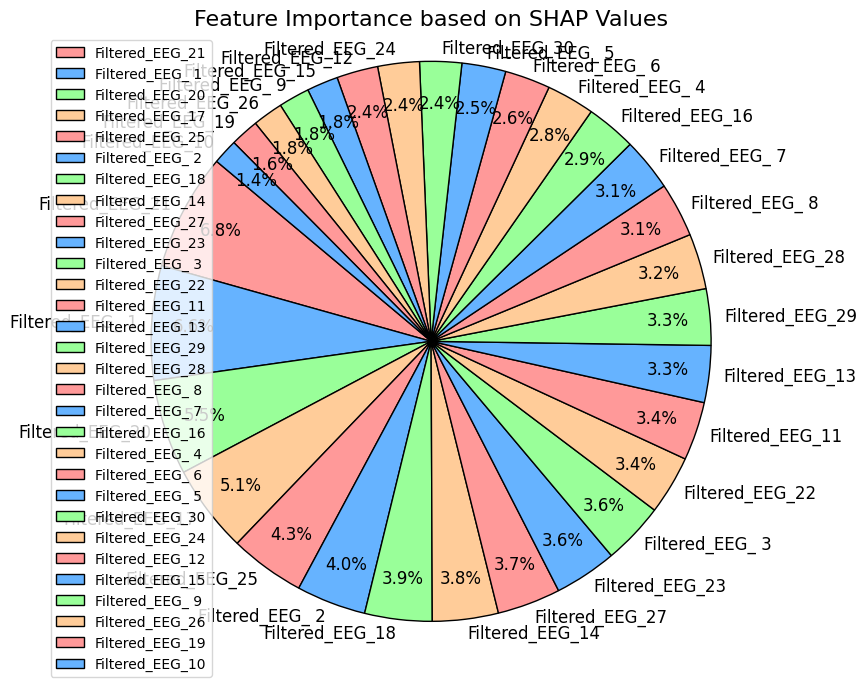

In [64]:
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']

plt.figure(figsize=(10, 8))


plt.pie(X_cols['Feature Importance'], 
        labels=X_cols.index, 
        autopct='%1.1f%%', 
        startangle=140, 
        colors=colors,      
        wedgeprops={'edgecolor': 'black'},  
        textprops={'fontsize': 12},  
        pctdistance=0.85,     
        labeldistance=1.05)   


plt.legend(X_cols.index, loc="best")
plt.title('Feature Importance based on SHAP Values', fontsize=16)
plt.axis('equal')
plt.show()

# Feature Selection using SHAP Values

In [65]:
# Calculate feature importance using mean absolute SHAP values
ft_importance = pd.DataFrame({"Feature Importance": np.abs(shap_values).mean(0)}, index=X_train.columns)
top_3_features = ft_importance.sort_values(by="Feature Importance", ascending=False).index[:4]

# Use selected features for further analysis or prediction
reduced_X_train = X_train[top_3_features]
reduced_X_test = X_test[top_3_features]

In [66]:
reduced_X_train

,Filtered_EEG_21,Filtered_EEG_ 1,Filtered_EEG_20,Filtered_EEG_17
120597,-0.220120,0.160825,-0.061680,-0.091143
485239,-0.106177,-0.031411,0.045362,-0.371828
760929,0.213155,-0.139928,0.081013,0.207012
325213,0.203564,-0.048321,0.059316,-0.305878
132923,-0.129255,-0.164635,-0.170723,-0.185397
...,...,...,...,...
565842,-0.107442,-0.320922,-0.176140,-0.126356
629510,0.098302,-0.017884,0.185285,0.151746
414260,-0.134250,-0.002778,-0.002617,0.513964
696415,-0.596010,-1.033021,-0.774572,-0.557004


In [67]:
reduced_X_test

,Filtered_EEG_21,Filtered_EEG_ 1,Filtered_EEG_20,Filtered_EEG_17
139433,-0.212462,-0.057243,-0.103230,-0.240119
527024,0.005192,-0.464039,-0.126020,0.357203
640745,-0.361086,-0.973852,-0.302662,-0.301548
361557,0.257604,0.037552,0.258840,0.048115
163987,0.103457,0.171642,0.100822,-0.013593
...,...,...,...,...
238967,-0.719923,-0.577253,-0.693953,-0.357373
467044,0.058177,-0.313303,-0.062117,-0.021512
139715,-0.183590,-0.172936,-0.188417,-0.154260
523374,-0.145893,-0.317165,-0.154261,0.079525


# Machine Learning Algorithms

In [68]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

### K-Nearest Neighbors (KNN)

In [69]:
from sklearn.neighbors import KNeighborsClassifier

# Define and train the K-Nearest Neighbors (KNN) model
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(reduced_X_train, y_train)

# Make predictions on the test set using KNN
y_pred_knn = knn_model.predict(reduced_X_test)

# Evaluate the KNN model
accuracy_knn = accuracy_score(y_test, y_pred_knn)
conf_matrix_knn = confusion_matrix(y_test, y_pred_knn)
classification_rep_knn = classification_report(y_test, y_pred_knn)

# Print evaluation metrics for KNN
print("\nK-Nearest Neighbors Model:")
print(f'Accuracy: {accuracy_knn:.4f}')
print('\nConfusion Matrix:')
print(conf_matrix_knn)
print('\nClassification Report:')
print(classification_rep_knn)


K-Nearest Neighbors Model:
Accuracy: 0.9444

Confusion Matrix:
[[74197  3479]
 [ 5156 72458]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95     77676
           1       0.95      0.93      0.94     77614

    accuracy                           0.94    155290
   macro avg       0.94      0.94      0.94    155290
weighted avg       0.94      0.94      0.94    155290



### Random Forest

In [70]:
from sklearn.ensemble import RandomForestClassifier

# Define and train the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(reduced_X_train, y_train)

# Make predictions on the test set using Random Forest
y_pred_rf = rf_model.predict(reduced_X_test)

# Evaluate the Random Forest model
accuracy_rf = accuracy_score(y_test, y_pred_rf)
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)
classification_rep_rf = classification_report(y_test, y_pred_rf)

# Print evaluation metrics for Random Forest
print("\nRandom Forest Model:")
print(f'Accuracy: {accuracy_rf:.4f}')
print('\nConfusion Matrix:')
print(conf_matrix_rf)
print('\nClassification Report:')
print(classification_rep_rf)



Random Forest Model:
Accuracy: 0.9359

Confusion Matrix:
[[73257  4419]
 [ 5541 72073]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.94      0.94     77676
           1       0.94      0.93      0.94     77614

    accuracy                           0.94    155290
   macro avg       0.94      0.94      0.94    155290
weighted avg       0.94      0.94      0.94    155290



### XGBoost (with GPU)

In [71]:
import xgboost as xgb

# Define and train the XGBoost model (with GPU)
xgb_model = xgb.XGBClassifier(tree_method='gpu_hist', gpu_id=0)
xgb_model.fit(reduced_X_train, y_train)

# Make predictions on the test set using XGBoost
y_pred_xgb = xgb_model.predict(reduced_X_test)

# Evaluate the XGBoost model
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
conf_matrix_xgb = confusion_matrix(y_test, y_pred_xgb)
classification_rep_xgb = classification_report(y_test, y_pred_xgb)

# Print evaluation metrics for XGBoost
print("\nXGBoost Model (with GPU):")
print(f'Accuracy: {accuracy_xgb:.4f}')
print('\nConfusion Matrix:')
print(conf_matrix_xgb)
print('\nClassification Report:')
print(classification_rep_xgb)



XGBoost Model (with GPU):
Accuracy: 0.7409

Confusion Matrix:
[[60352 17324]
 [22911 54703]]

Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.78      0.75     77676
           1       0.76      0.70      0.73     77614

    accuracy                           0.74    155290
   macro avg       0.74      0.74      0.74    155290
weighted avg       0.74      0.74      0.74    155290



### Decision Tree

In [72]:
from sklearn.tree import DecisionTreeClassifier

# Define and train the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(reduced_X_train, y_train)

# Make predictions on the test set using Decision Tree
y_pred_dt = dt_model.predict(reduced_X_test)

# Evaluate the Decision Tree model
accuracy_dt = accuracy_score(y_test, y_pred_dt)
conf_matrix_dt = confusion_matrix(y_test, y_pred_dt)
classification_rep_dt = classification_report(y_test, y_pred_dt)

# Print evaluation metrics for Decision Tree
print("\nDecision Tree Model:")
print(f'Accuracy: {accuracy_dt:.4f}')
print('\nConfusion Matrix:')
print(conf_matrix_dt)
print('\nClassification Report:')
print(classification_rep_dt)


Decision Tree Model:
Accuracy: 0.8840

Confusion Matrix:
[[68703  8973]
 [ 9038 68576]]

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.88      0.88     77676
           1       0.88      0.88      0.88     77614

    accuracy                           0.88    155290
   macro avg       0.88      0.88      0.88    155290
weighted avg       0.88      0.88      0.88    155290

